# Oil Spill in Ocean , Image Processing Project 
Enhance images of oil spills in the oceans using image processing to help in accurately classify them as either having an oil spill or not in next stage using CNN, in order to inform the competent authorities and reduce the impact of oil spills on the marine ecosystem.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from IPython.display import display


# **First** **Image**

## Original Image

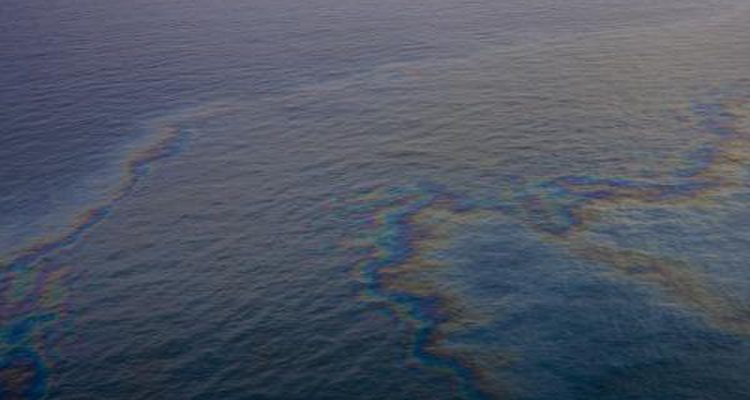

In [ ]:
img = cv2.imread("/content/Image_1_IP.jpg")
img = cv2.resize(img, (750,400))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert img from the defult BGR to RGB
display(Image.fromarray(img))

## Convert the image from RGB to Gray

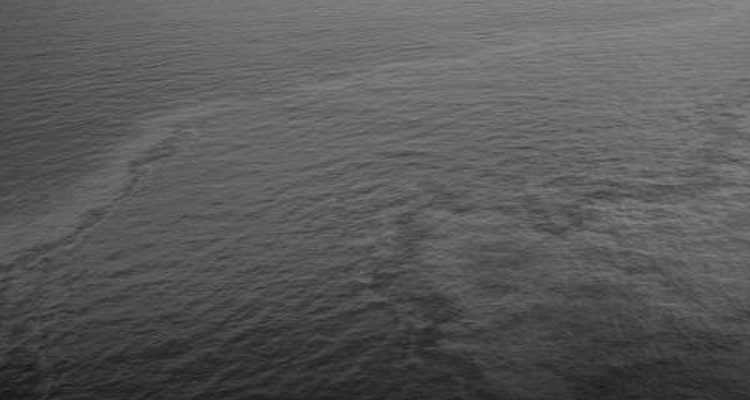

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Converting BGR to RGB
display(Image.fromarray(img))

## Transform Image to Negative 

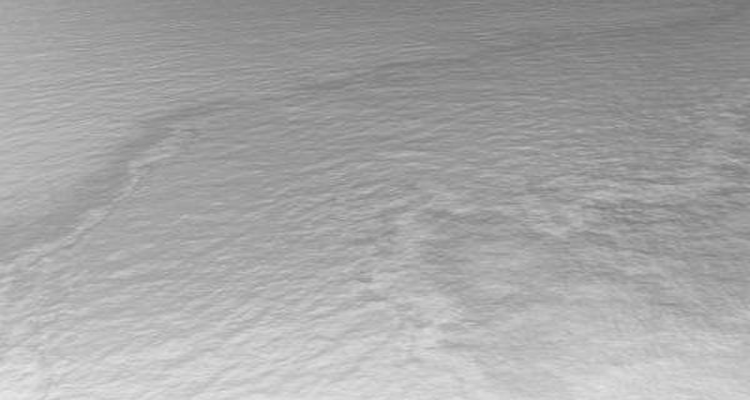

In [ ]:
ngtv_img = abs(255-img)
display(Image.fromarray(ngtv_img))

img = ngtv_img

## Image Blurring (Image Smoothing)



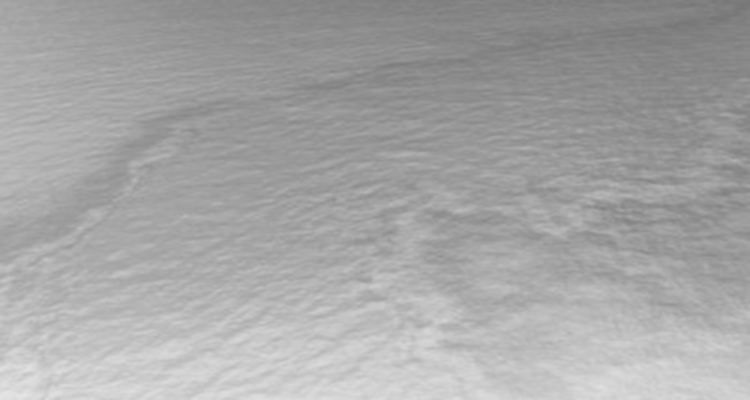

In [ ]:
blur = cv2.GaussianBlur(img,(5,5),0)
display(Image.fromarray(blur))

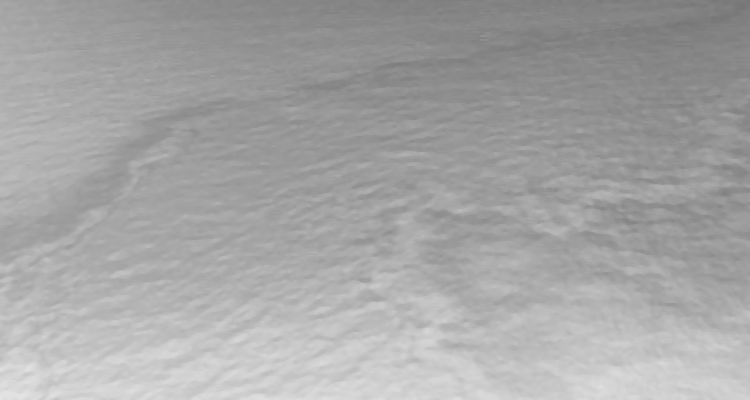

In [ ]:
median = cv2.medianBlur(img,5)
display(Image.fromarray(median))

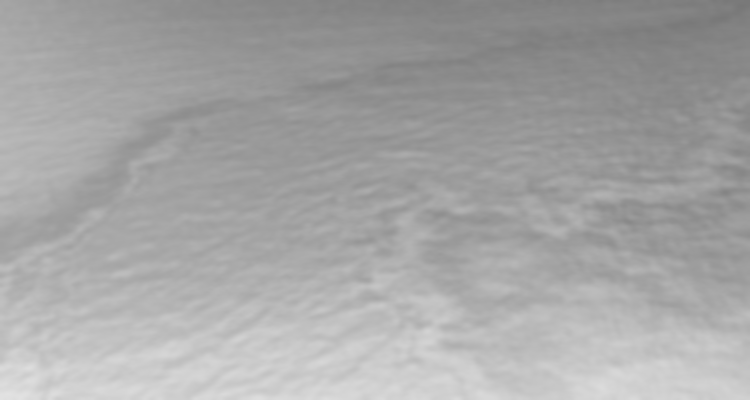

In [ ]:
blur = cv2.bilateralFilter(img,9,75,75)
display(Image.fromarray(blur))

## Adaptive image thresholding using Otsu's thresholding method
Replace image pixels into white in those regions, where saturation is greater than T and into the black in the opposite cases.



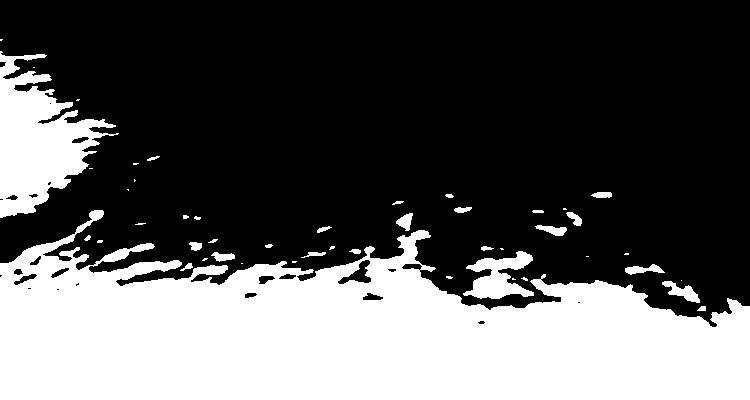

In [ ]:
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
display(Image.fromarray(th3)) 

##  Color-space , help in Object Tracking


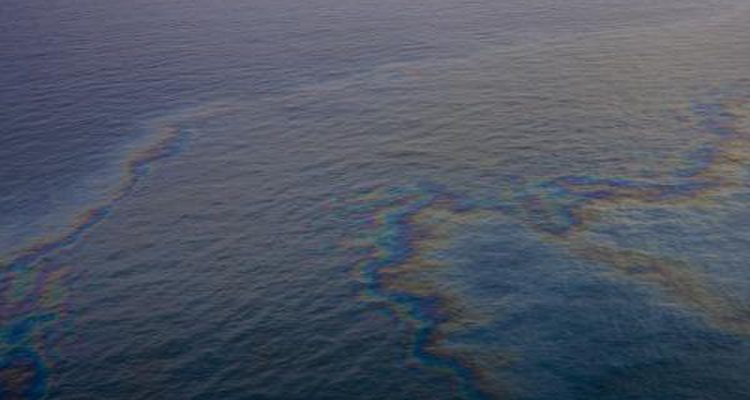

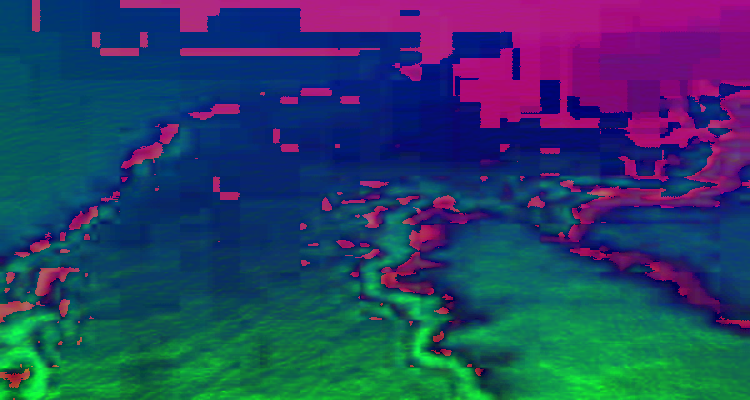

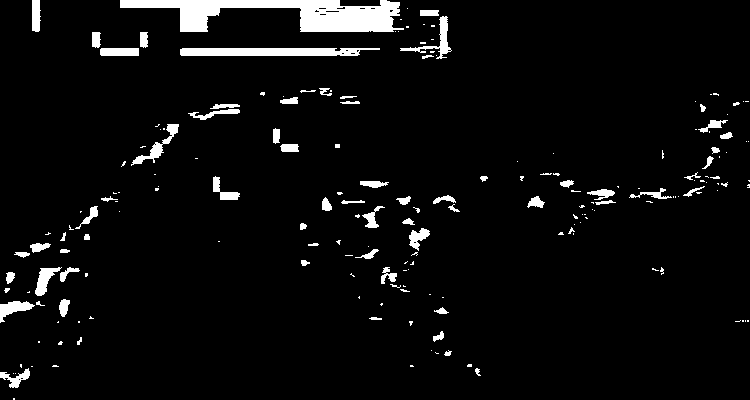

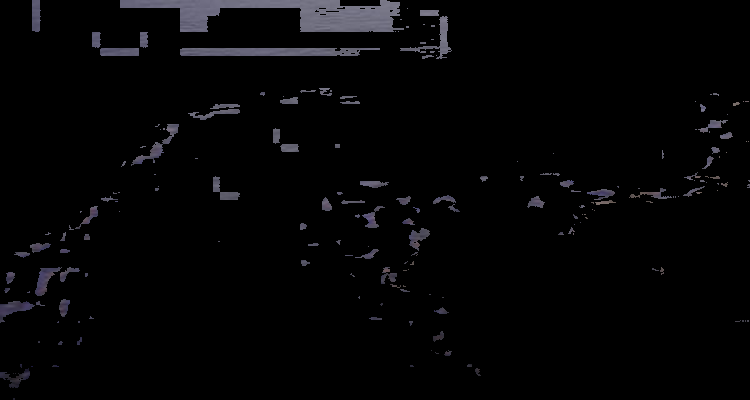

In [ ]:
color_img = cv2.imread("/content/Image_1_IP.jpg")
color_img = cv2.resize(color_img, (750,400))
color_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)
display(Image.fromarray(color_img))

hsv = cv2.cvtColor(color_img , cv2.COLOR_BGR2HSV)
display(Image.fromarray(hsv))

lower_blue = np.array([110,30,30])
upper_blue = np.array([190,190,255])

mask = cv2.inRange(hsv, lower_blue, upper_blue)
display(Image.fromarray(mask))

res = cv2.bitwise_and(color_img,color_img, mask= mask)
display(Image.fromarray(res))

## Histogram Equalization

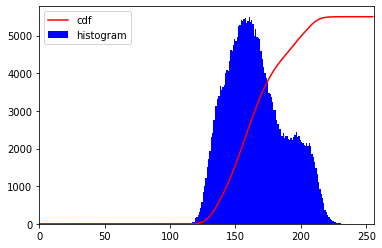

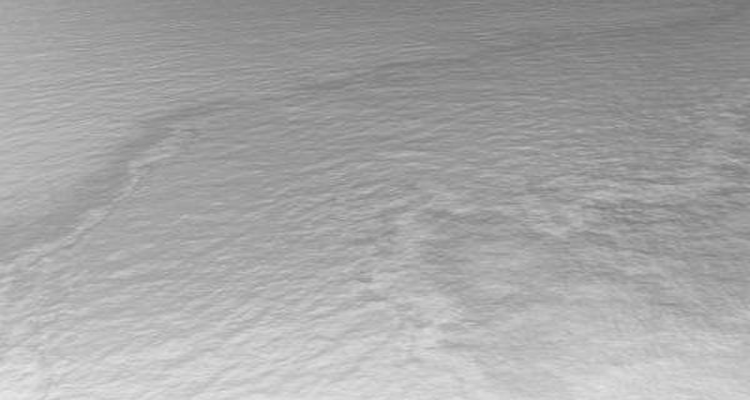

In [ ]:
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()
plt.plot(cdf_normalized, color = 'r')
plt.hist(img.flatten(),256,[0,256], color = 'b')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

display(Image.fromarray(img))

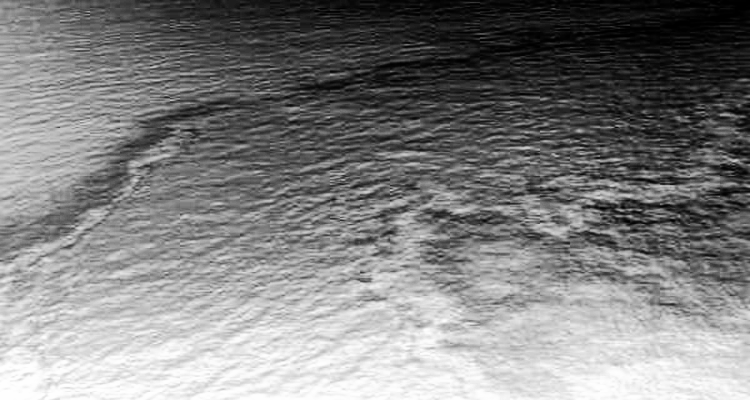

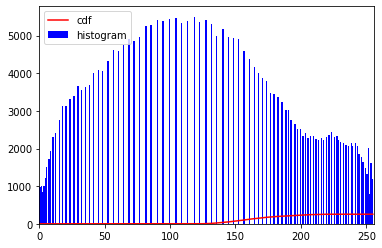

In [ ]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
img2 = cdf[img]
display(Image.fromarray(img2))

plt.plot(cdf, color = 'r')
plt.hist(img2.flatten(),256,[0,256], color = 'b')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

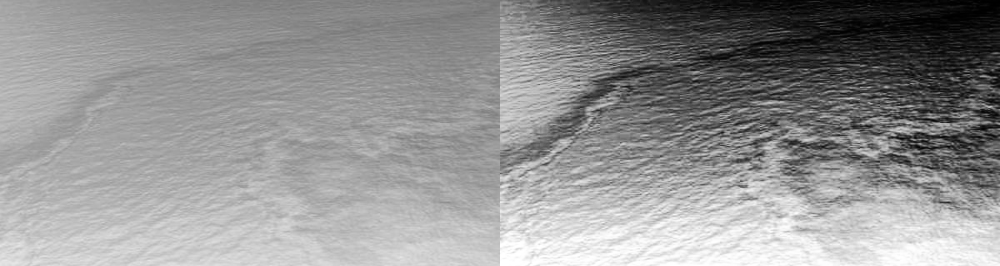

In [ ]:
equ = cv2.equalizeHist(img)
res = np.hstack((img,equ)) 
# cv2.imwrite('res.png',res)
display(Image.fromarray(res))

##  Canny Edge Detection


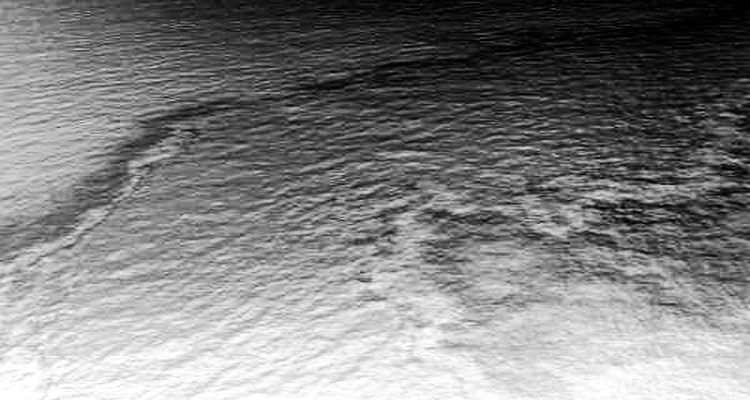

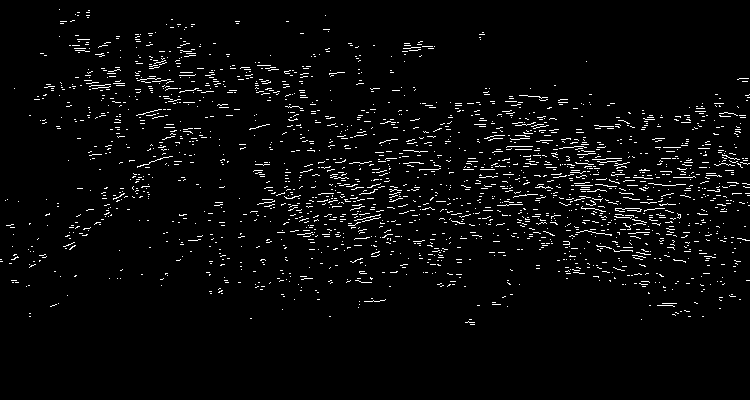

In [ ]:
edges = cv2.Canny(equ,300,300)
display(Image.fromarray(equ))
display(Image.fromarray(edges))

## Otsu's thresholding method again

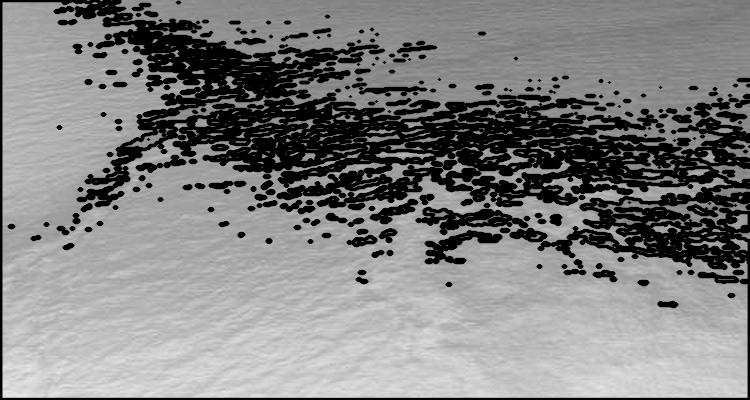

In [ ]:
ret, thresh = cv2.threshold(img, 150, 255, cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
image_copy = img.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

display(Image.fromarray(image_copy))


#### this code is just the preprocessing step, the next step should be Oil Spill Detection, using K-means clustering or Convolution Neural Networks (CNN)

# **Second Image**

##Original Image


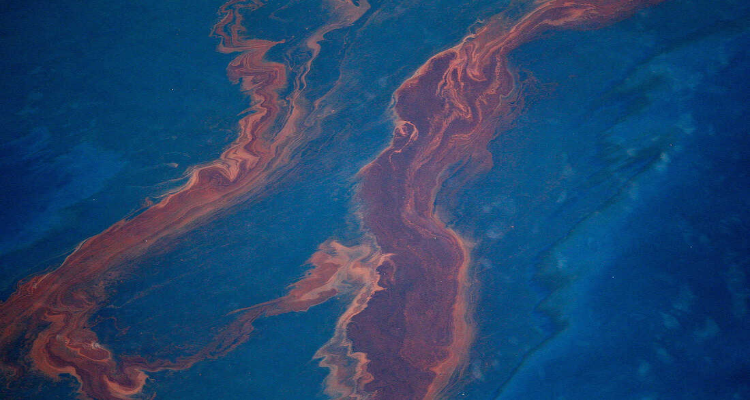

In [ ]:
img_2 = cv2.imread("/content/Image_2_IP.jpg")
img_2 = cv2.resize(img_2, (750,400))
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB) # convert img from the defult BGR to RGB
display(Image.fromarray(img_2))
# plt.imshow(img)

##Convert the image from RGB to Gray

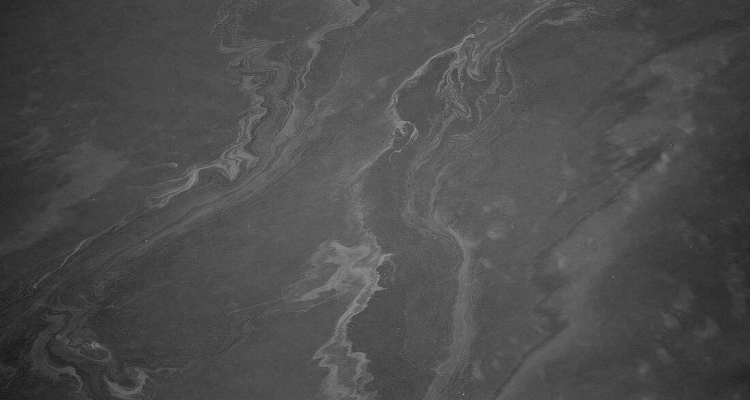

In [ ]:
img_2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # Converting BGR to RGB
display(Image.fromarray(img_2))

## Transform Image to Negative 

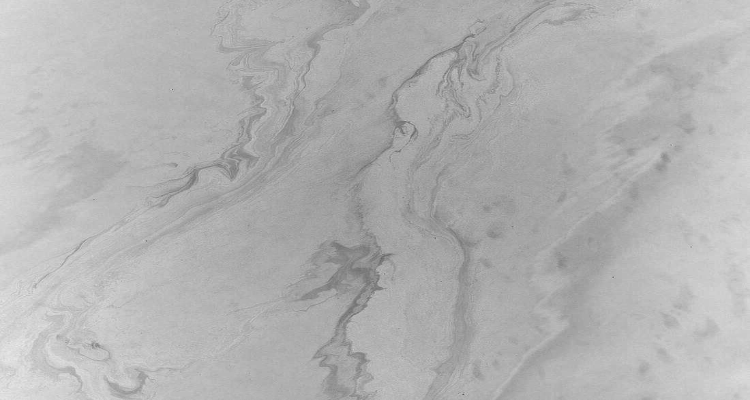

In [ ]:
ngtv_img = abs(255-img_2)
display(Image.fromarray(ngtv_img))

img_2 = ngtv_img

##Image Blurring (Image Smoothing)

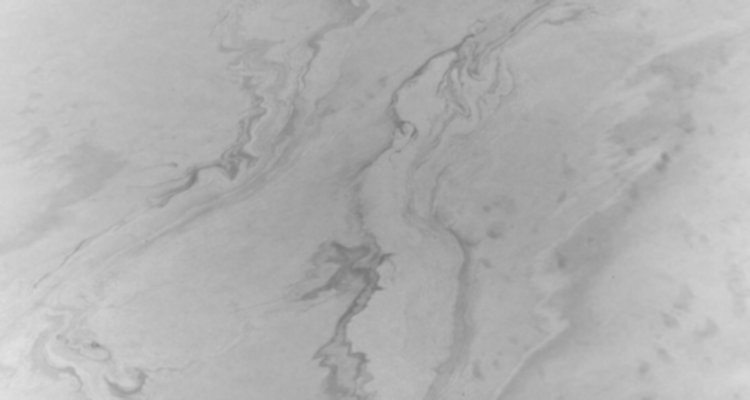

In [ ]:
blur = cv2.GaussianBlur(img_2,(5,5),0)
display(Image.fromarray(blur))

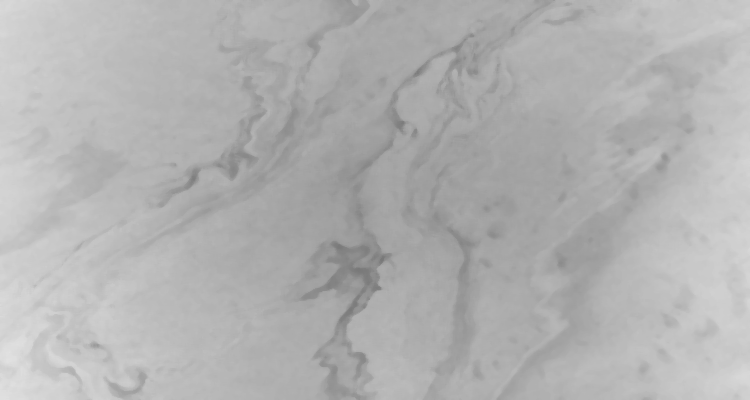

In [ ]:
median = cv2.medianBlur(img_2,5)
display(Image.fromarray(median))

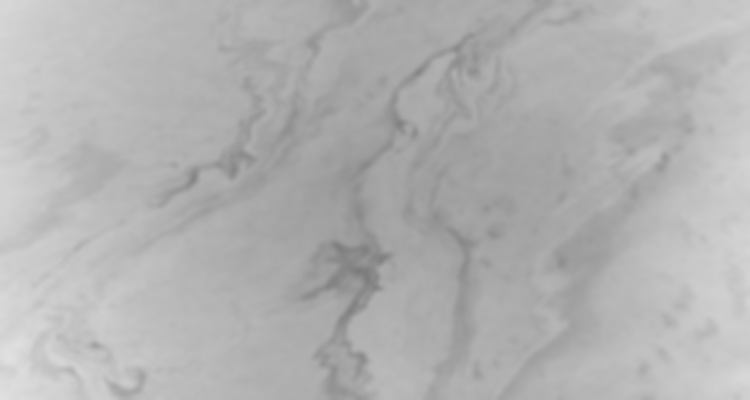

In [ ]:
blur = cv2.bilateralFilter(img_2,9,75,75)
display(Image.fromarray(blur))

##Adaptive image thresholding using Otsu's thresholding method

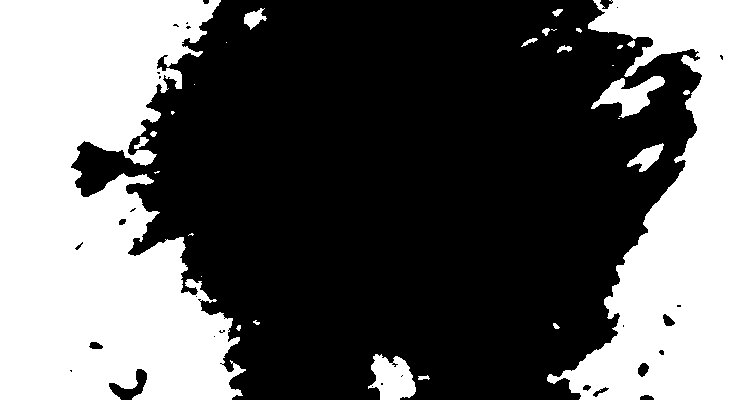

In [ ]:
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
display(Image.fromarray(th3))

##Color-space , help in Object Tracking

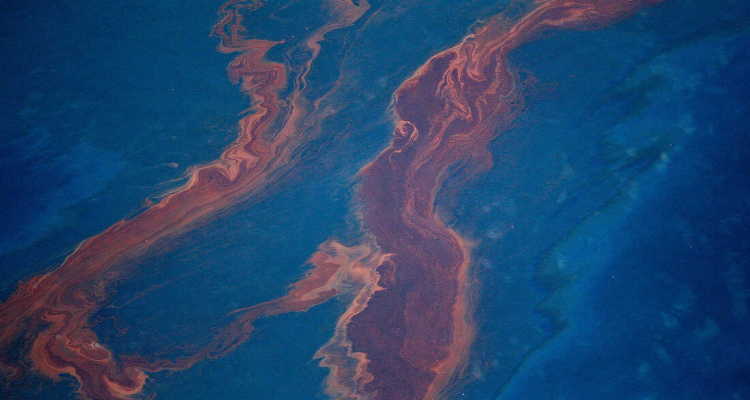

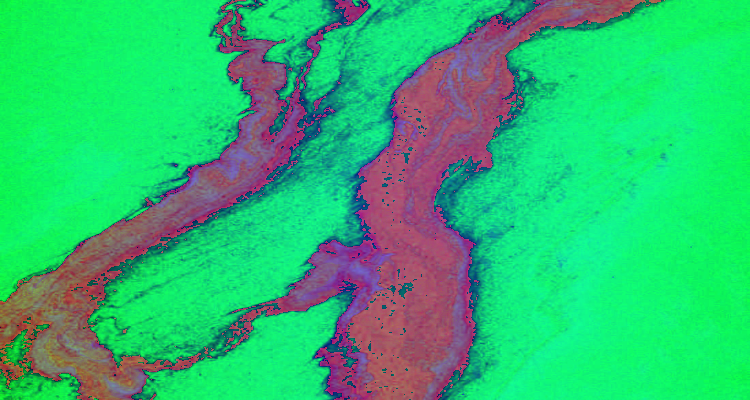

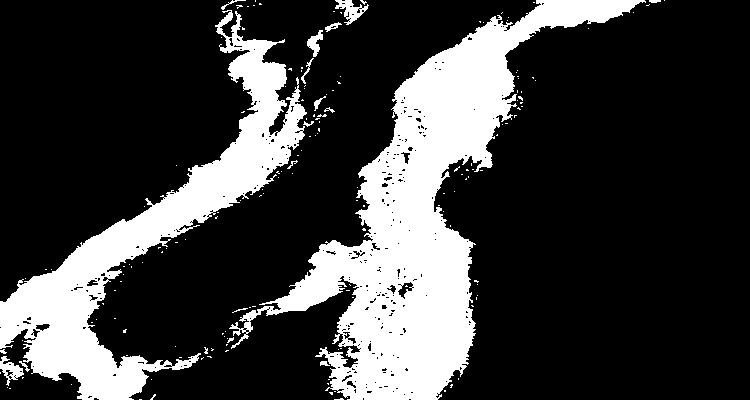

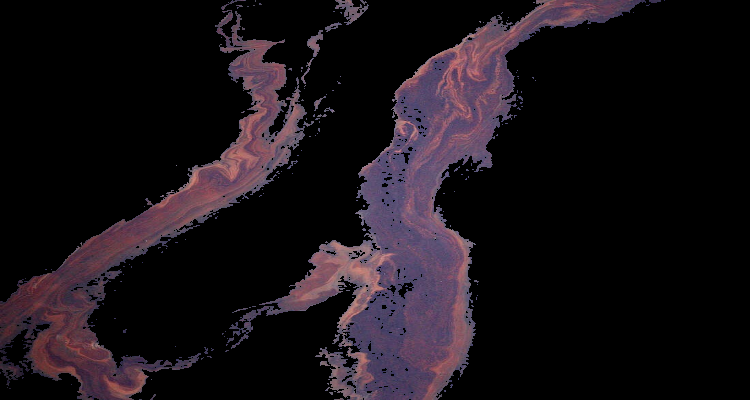

In [ ]:
color_img = cv2.imread("/content/Image_2_IP.jpeg")
color_img = cv2.resize(color_img, (750,400))
color_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)
display(Image.fromarray(color_img))

hsv = cv2.cvtColor(color_img , cv2.COLOR_BGR2HSV)
display(Image.fromarray(hsv))

lower_blue = np.array([110,30,30])
upper_blue = np.array([190,190,255])

mask = cv2.inRange(hsv, lower_blue, upper_blue)
display(Image.fromarray(mask))

res = cv2.bitwise_and(color_img,color_img, mask= mask)
display(Image.fromarray(res))


##Histogram Equalization

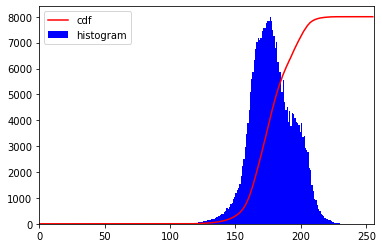

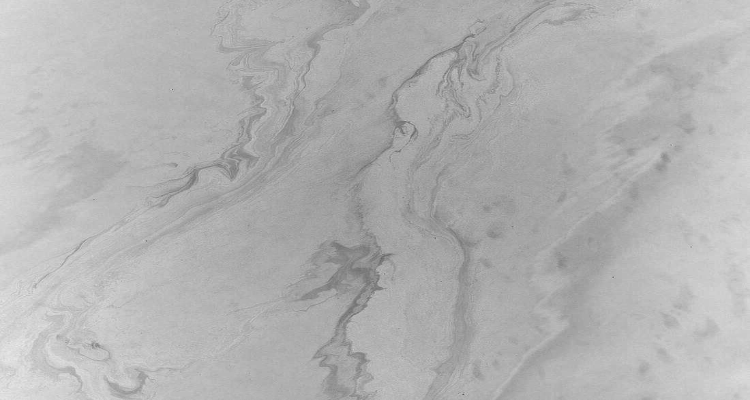

In [ ]:
hist,bins = np.histogram(img_2.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()
plt.plot(cdf_normalized, color = 'r')
plt.hist(img_2.flatten(),256,[0,256], color = 'b')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

display(Image.fromarray(img_2))

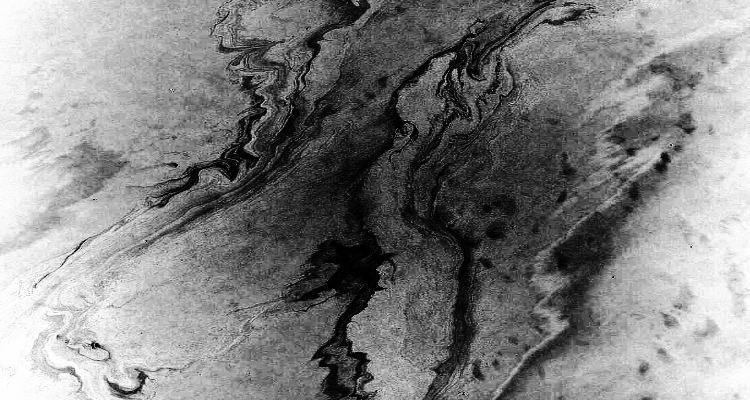

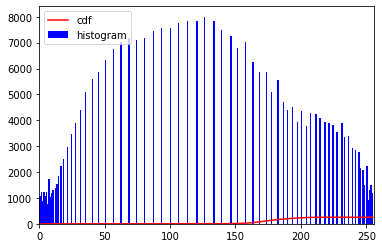

In [ ]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
img2 = cdf[img_2]
display(Image.fromarray(img2))

plt.plot(cdf, color = 'r')
plt.hist(img2.flatten(),256,[0,256], color = 'b')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

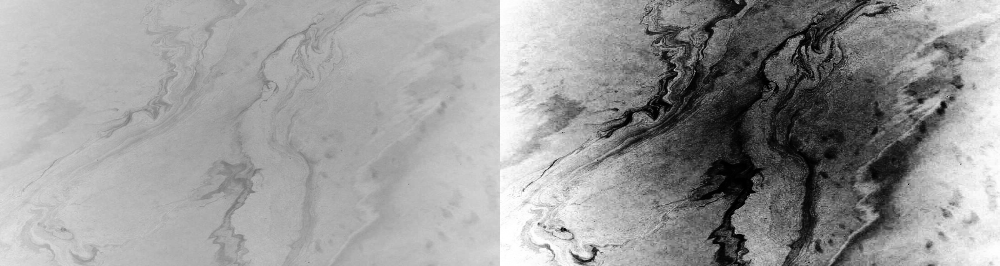

In [ ]:
equ = cv2.equalizeHist(img_2)
res = np.hstack((img_2,equ)) 
# cv2.imwrite('res.png',res)
display(Image.fromarray(res))

##Canny Edge Detection

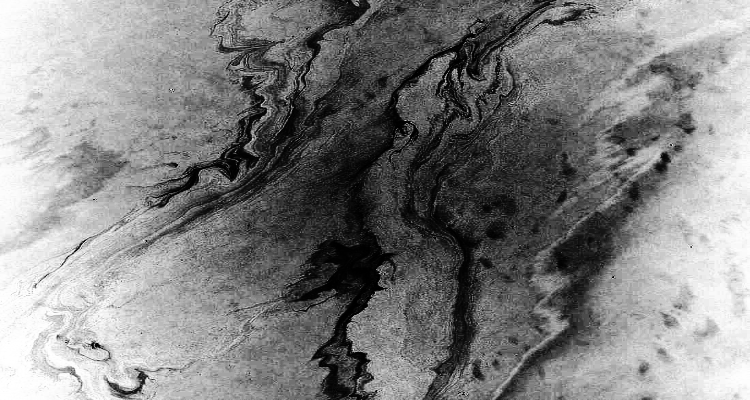

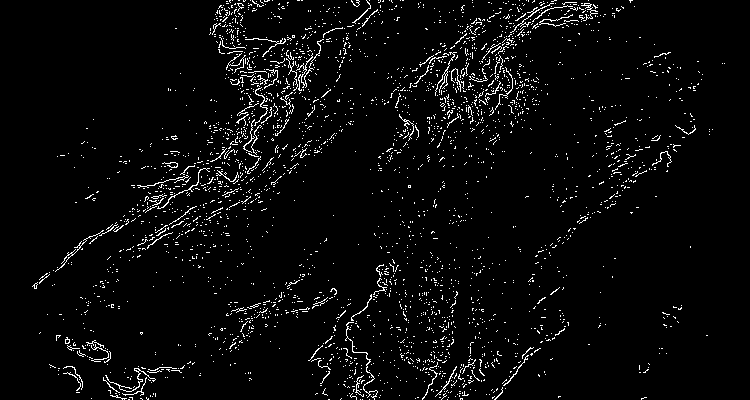

In [ ]:
edges = cv2.Canny(equ,300,300)
display(Image.fromarray(equ))
display(Image.fromarray(edges))

##Otsu's thresholding method again

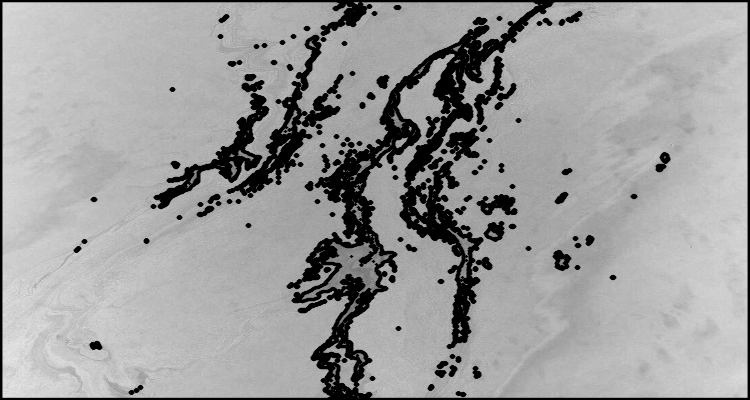

In [ ]:
ret, thresh = cv2.threshold(img_2, 150, 255, cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
image_copy = img_2.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

display(Image.fromarray(image_copy))

# **Third Image**

##Original Image

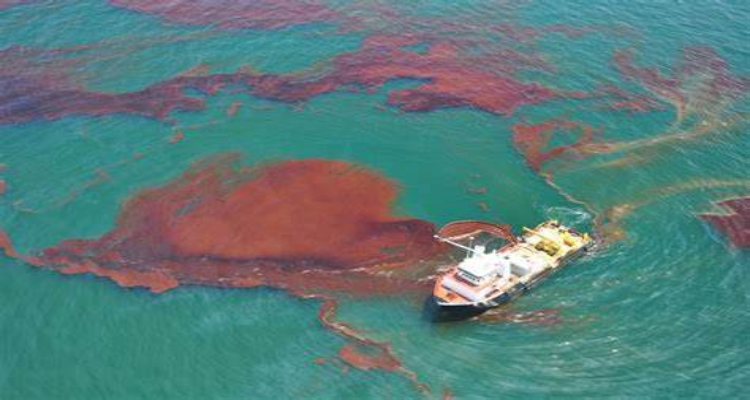

In [ ]:
img_3 = cv2.imread("/content/Image_3_IP.jpg")
img_3 = cv2.resize(img_3, (750,400))
img_3 = cv2.cvtColor(img_3, cv2.COLOR_BGR2RGB) # convert img from the defult BGR to RGB
display(Image.fromarray(img_3))
# plt.imshow(img)

##Convert the image from RGB to Gray

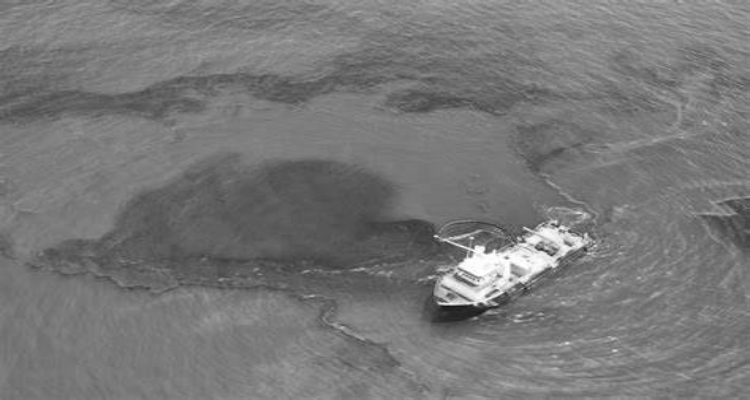

In [ ]:
img_3 = cv2.cvtColor(img_3, cv2.COLOR_BGR2GRAY) # Converting BGR to RGB
display(Image.fromarray(img_3))

## Transform Image to Negative 

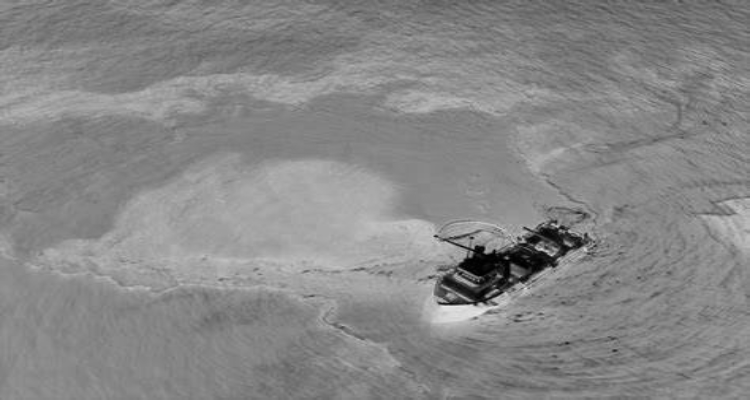

In [ ]:
ngtv_img = abs(255-img_3)
display(Image.fromarray(ngtv_img))

img = ngtv_img

##Image Blurring (Image Smoothing)

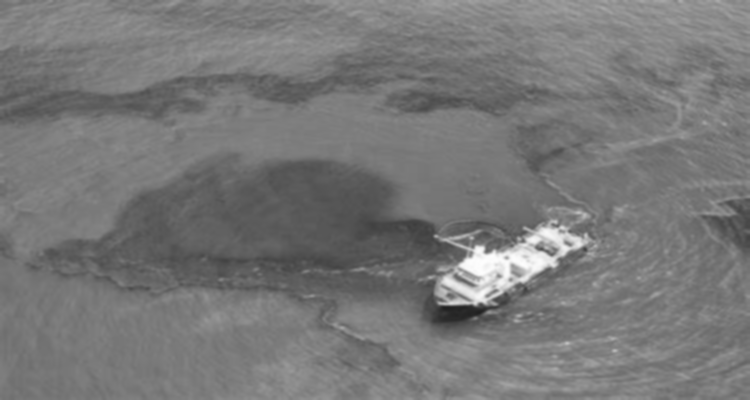

In [ ]:
blur = cv2.GaussianBlur(img_3,(5,5),0)
display(Image.fromarray(blur))

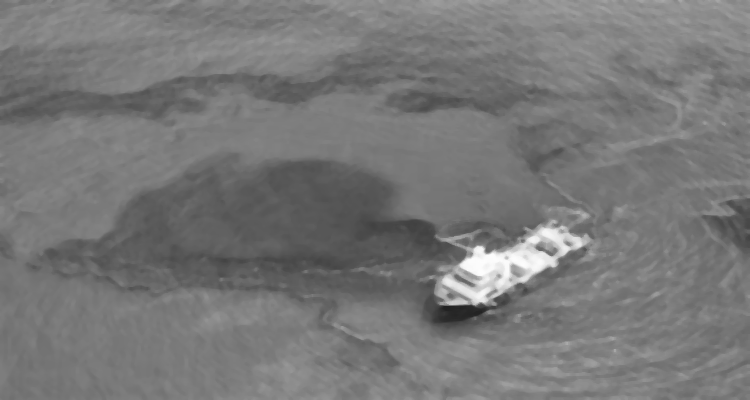

In [ ]:
median = cv2.medianBlur(img_3,5)
display(Image.fromarray(median))

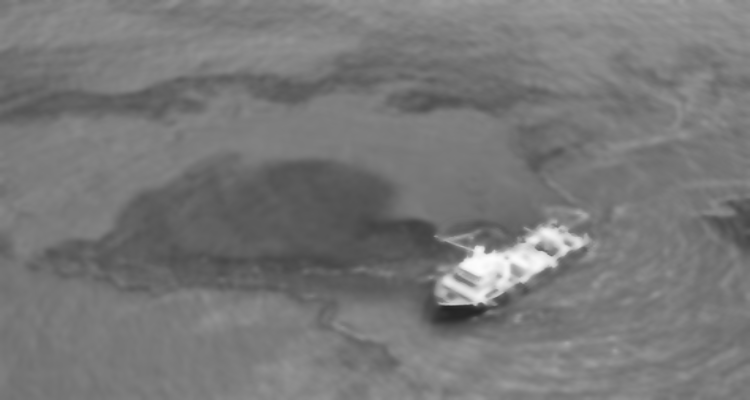

In [ ]:
blur = cv2.bilateralFilter(img_3,9,75,75)
display(Image.fromarray(blur))

##Adaptive image thresholding using Otsu's thresholding method

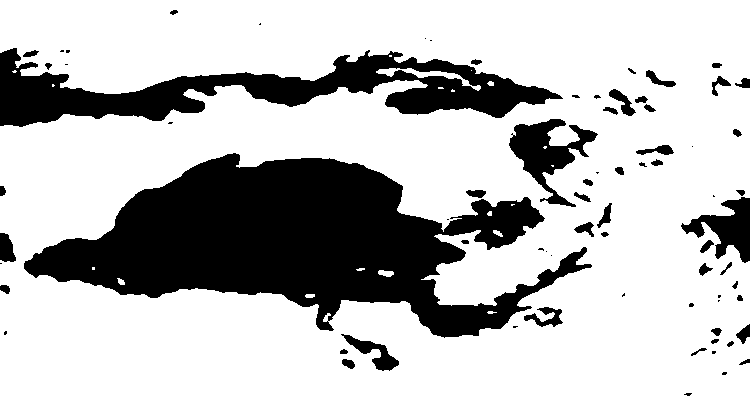

In [ ]:
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
display(Image.fromarray(th3))

##Color-space , help in Object Tracking

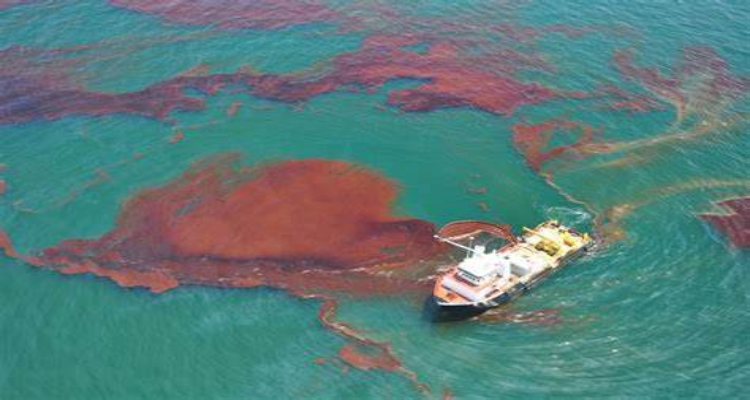

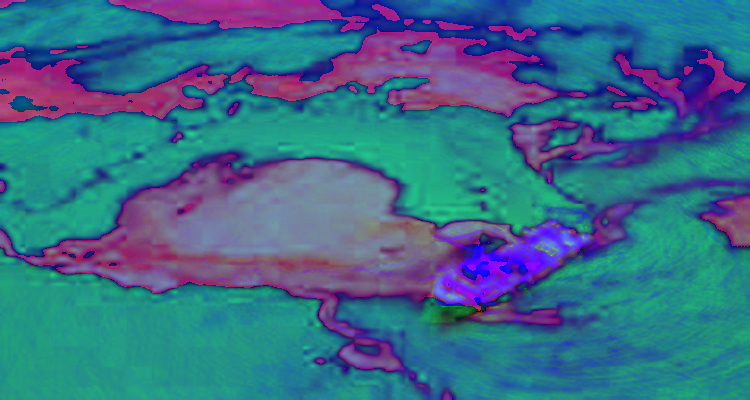

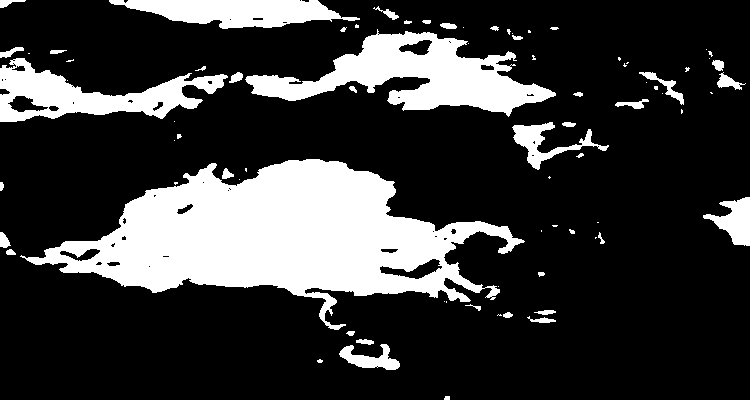

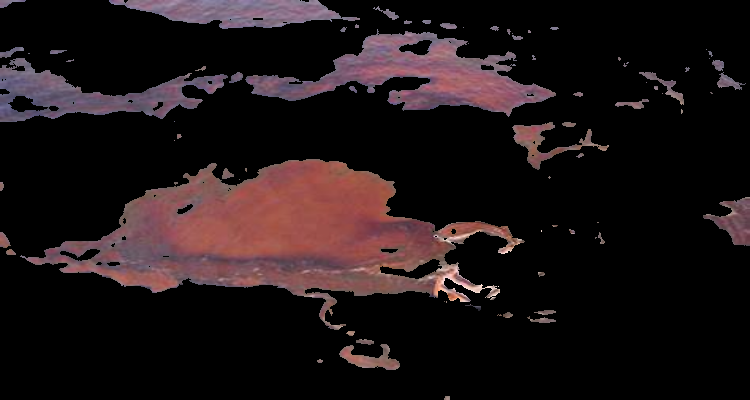

In [ ]:
color_img = cv2.imread("/content/Image_3_IP.jpeg")
color_img = cv2.resize(color_img, (750,400))
color_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)
display(Image.fromarray(color_img))

hsv = cv2.cvtColor(color_img , cv2.COLOR_BGR2HSV)
display(Image.fromarray(hsv))

lower_blue = np.array([110,30,30])
upper_blue = np.array([190,190,255])

mask = cv2.inRange(hsv, lower_blue, upper_blue)
display(Image.fromarray(mask))

res = cv2.bitwise_and(color_img,color_img, mask= mask)
display(Image.fromarray(res))

##Histogram Equalization

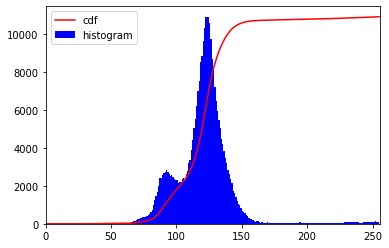

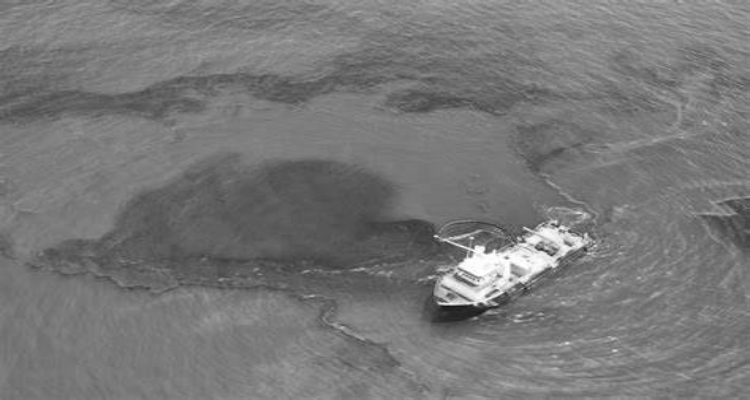

In [ ]:
hist,bins = np.histogram(img_3.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()
plt.plot(cdf_normalized, color = 'r')
plt.hist(img_3.flatten(),256,[0,256], color = 'b')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

display(Image.fromarray(img_3))

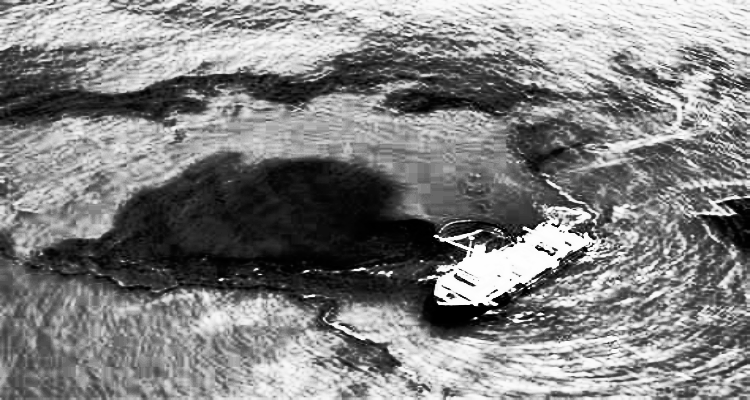

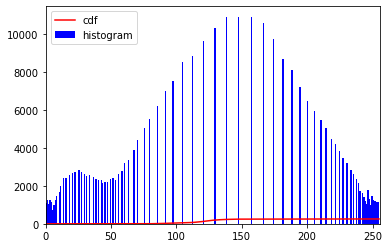

In [ ]:
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
img2 = cdf[img_3]
display(Image.fromarray(img2))

plt.plot(cdf, color = 'r')
plt.hist(img2.flatten(),256,[0,256], color = 'b')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

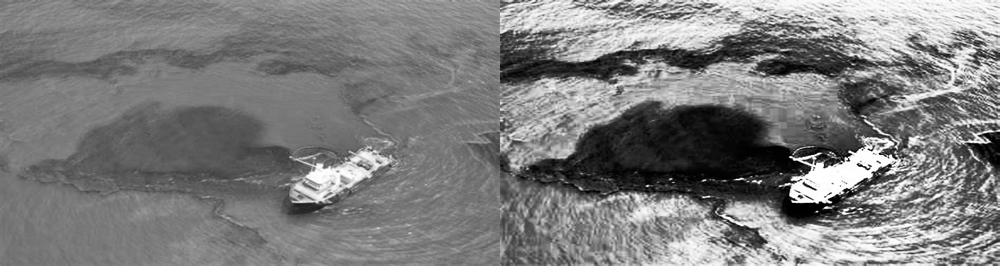

In [ ]:
equ = cv2.equalizeHist(img_3)
res = np.hstack((img_3,equ)) 
# cv2.imwrite('res.png',res)
display(Image.fromarray(res))

##Canny Edge Detection

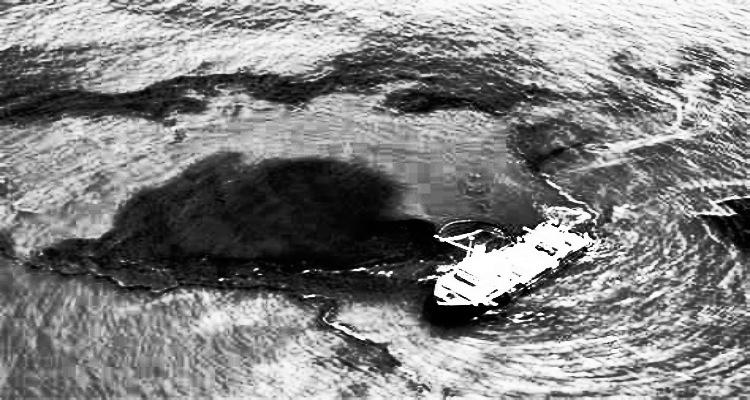

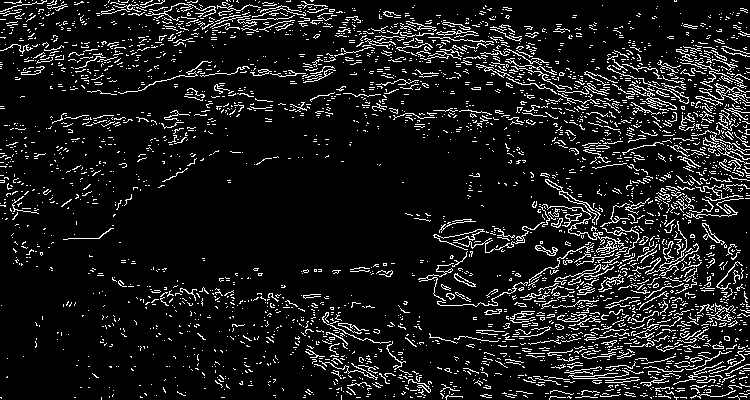

In [ ]:
edges = cv2.Canny(equ,300,300)
display(Image.fromarray(equ))
display(Image.fromarray(edges))

##Otsu's thresholding method again

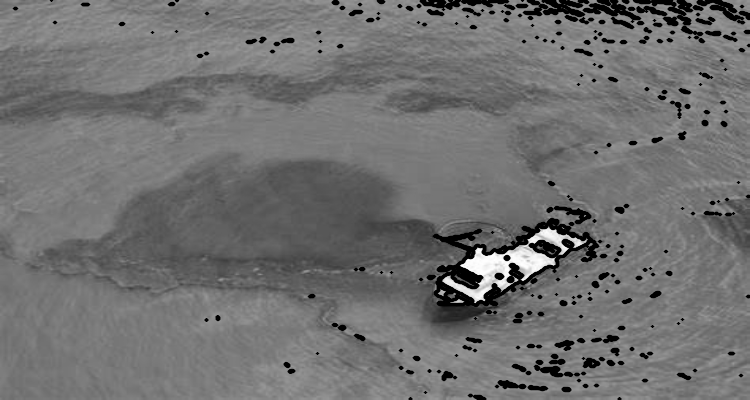

In [ ]:
ret, thresh = cv2.threshold(img_3, 150, 255, cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
image_copy = img_3.copy()
cv2.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)

display(Image.fromarray(image_copy))